In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import cv2
import os
import glob
from PIL import Image
from skimage import transform
import tensorflow as tf

In [2]:
# 필요 라이브러리 로딩
from __future__ import absolute_import, division
from __future__ import print_function, unicode_literals

import os
import time
import shutil
import functools

import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import matplotlib as mpl
mpl.rcParams['axes.grid'] = False
mpl.rcParams['figure.figsize'] = (12,12)

from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
import matplotlib.image as mpimg
import pandas as pd
from PIL import Image
from IPython.display import clear_output

import tensorflow as tf
import tensorflow_addons as tfa
print(tf.__version__)

from tensorflow.keras import layers
from tensorflow.keras import losses
from tensorflow.keras import models

2.3.1


In [3]:
file_path = './metainfo_train.csv'

df = pd.read_csv(file_path)
df.head()

,name,temp,ir_min,ir_max
0,85732,29.0,25.7,42.9
1,85747,29.0,23.1,39.3
2,85814,29.0,29.3,42.8
3,85829,29.0,25.3,33.9
4,85842,29.0,25.2,35.5


In [4]:
df.shape

(500, 4)

In [5]:
submission_path = './output_sample.csv'
submission = pd.read_csv(submission_path)
submission.head()

,0.0,0.0.1,0.0.2,0.0.3,0.0.4,0.0.5,0.0.6,0.0.7,0.0.8,0.0.9,...,0.0.425,0.0.426,0.0.427,0.0.428,0.0.429,0.0.430,0.0.431,0.0.432,0.0.433,0.0.434
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [6]:
test_path = './metainfo_test.csv'
test = pd.read_csv(test_path)
test.head()

,name,temp,ir_min,ir_max
0,85946,29.0,21.0,37.0
1,90016,29.0,29.3,40.5
2,90128,29.0,25.6,37.7
3,90150,29.0,23.1,34.3
4,90203,29.0,22.1,35.6


In [7]:
df.describe()

,name,temp,ir_min,ir_max
count,500.000000,500.000000,500.00000,500.000000
mean,129630.144000,21.344000,15.31920,29.938400
std,30283.747432,7.324477,8.35839,9.545424
min,85732.000000,8.000000,-18.30000,10.800000
25%,101108.500000,16.000000,9.60000,23.100000
50%,115182.000000,22.000000,13.95000,29.300000
75%,165508.000000,27.000000,21.50000,34.325000
max,180003.000000,29.000000,30.40000,99.000000


In [8]:
import cv2
import os
import glob

In [9]:
train_image_path = './train/'

In [10]:
image_path = []
cwsi_path = []
for name in df['name']:
    sub_name = '0' * (6 - len(str(name))) + str(name)
    img_pth = './train/' + sub_name + '/IR_' + sub_name + '_input.jpg'
    cwsi_pth = './train/' + sub_name + '/CWSI_' + sub_name + '_output.csv'
    image_path.append(img_pth)
    cwsi_path.append(cwsi_pth)

print(len(image_path), len(cwsi_path))
print(image_path[:3])
print(cwsi_path[:3])

500 500
['./train/085732/IR_085732_input.jpg', './train/085747/IR_085747_input.jpg', './train/085814/IR_085814_input.jpg']
['./train/085732/CWSI_085732_output.csv', './train/085747/CWSI_085747_output.csv', './train/085814/CWSI_085814_output.csv']


In [11]:
df['image_path'] = image_path
df['cwsi_path'] = cwsi_path

df.head()

,name,temp,ir_min,ir_max,image_path,cwsi_path
0,85732,29.0,25.7,42.9,./train/085732/IR_085732_input.jpg,./train/085732/CWSI_085732_output.csv
1,85747,29.0,23.1,39.3,./train/085747/IR_085747_input.jpg,./train/085747/CWSI_085747_output.csv
2,85814,29.0,29.3,42.8,./train/085814/IR_085814_input.jpg,./train/085814/CWSI_085814_output.csv
3,85829,29.0,25.3,33.9,./train/085829/IR_085829_input.jpg,./train/085829/CWSI_085829_output.csv
4,85842,29.0,25.2,35.5,./train/085842/IR_085842_input.jpg,./train/085842/CWSI_085842_output.csv


In [12]:
train_length = int(len(df) * 0.8)

train = df[:train_length]
val = df[train_length:]

print(train.shape, val.shape)

(400, 6) (100, 6)


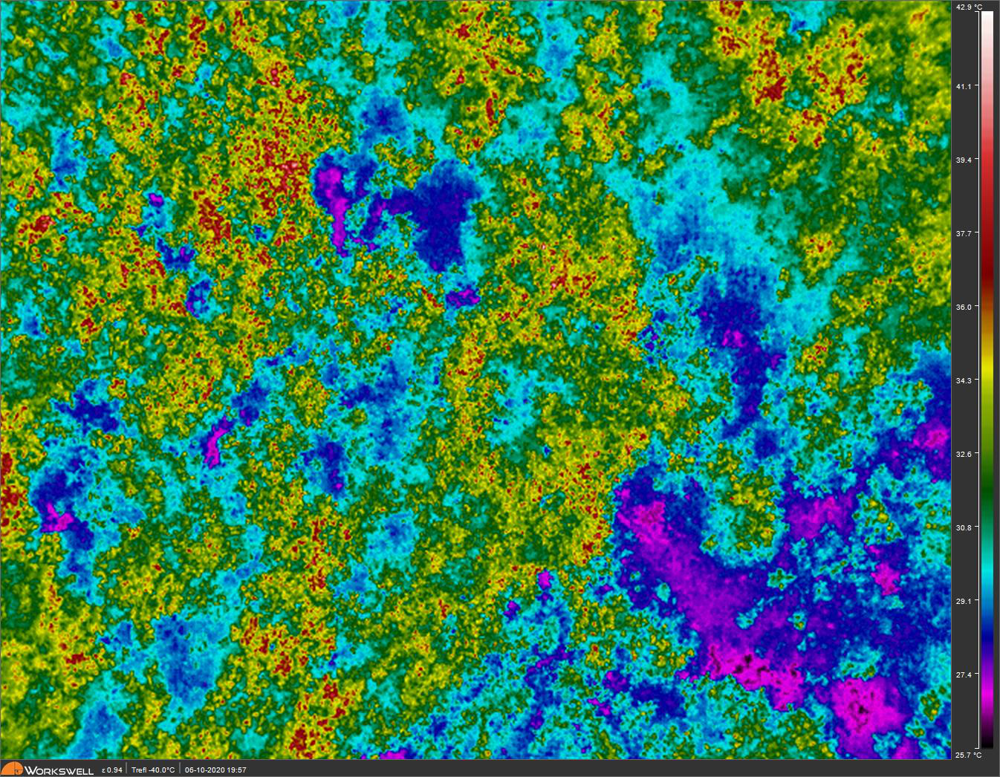

In [13]:
from PIL import Image

Image.open(train['image_path'][0])

In [14]:
def csv_to_np(csv_path):
    df = pd.read_csv(csv_path, header=None)
    return np.array(df)

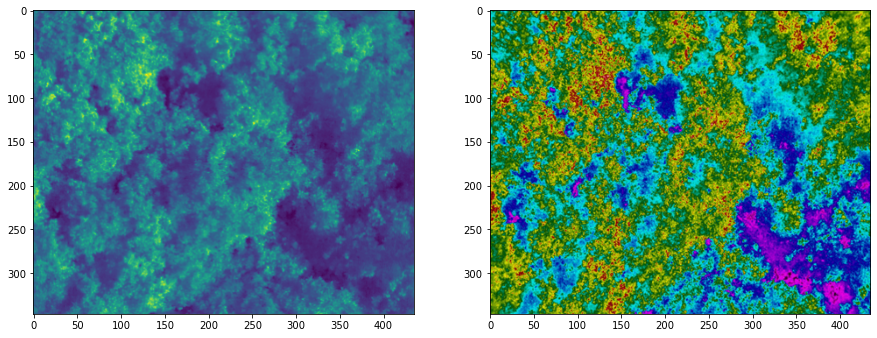

In [15]:
import matplotlib.pyplot as plt

plt.figure(figsize=(15, 10))
data = csv_to_np(train['cwsi_path'][0])
img = Image.fromarray(data)
#img.show()

plt.subplot(1, 2, 1)
plt.imshow(data)

plt.subplot(1, 2, 2)
img = Image.open(train['image_path'][0])
box = (0, 0, 1280, 1022)
img = img.crop(box)
img = img.resize((435, 347))
plt.imshow(img)

plt.show()

**이미지 전처리하는 함수**

1. 이미지 crop => 옆에 상태바를 없애주어야 한다.
2. 이미지 resize => csv 파일에 맞는 (436, 347)로 resize!
3. temp, ir_min, ir_max에 따라 값이 달라지니 이것을 기준으로? 생각을 해보는 것이 좋을 것 같은데..!!

In [16]:
# image_size = 352, 448

In [17]:
def preprocess_image(img_pth, csv_pth):
    img = Image.open(img_pth)
    img = img.crop((0, 0, 1280, 1022)) # resize
    img = img.resize((448, 352)) # crop
    
    np_data = csv_to_np(csv_pth)
    np_data = transform.resize(np_data, (352, 448, 1))
    label_img = tf.keras.preprocessing.image.array_to_img(np_data)
    
    return img, label_img

In [58]:
from tqdm import tqdm 
imgs = []
label_imgs = []

for image_path, cwsi_path in tqdm(zip(train['image_path'], train['cwsi_path'])):
    img, label_img = preprocess_image(image_path, cwsi_path)
    
    img_tensor = np.array(img).astype(np.float32)
    img_tensor = img_tensor.reshape(-1, 352, 448, 3)
    
    label_img_tensor = np.array(label_img).astype(np.float32)
    label_img_tensor = transform.resize(label_img_tensor, (352, 448, 1))
    label_img_tensor = label_img_tensor.reshape(-1, 352, 448, 1)
    
    imgs.append(img_tensor)
    label_imgs.append(label_img_tensor)

print(len(imgs), len(label_imgs))

400it [00:20, 19.29it/s]

400 400


In [59]:
from tqdm import tqdm

val_imgs = []
val_label_imgs = []

for image_path, cwsi_path in tqdm(zip(val['image_path'], val['cwsi_path'])):
    img, label_img = preprocess_image(image_path, cwsi_path)
    
    img_tensor = np.array(img).astype(np.float32)
    img_tensor = img_tensor.reshape(-1, 352, 448, 3)
    
    label_img_tensor = np.array(label_img).astype(np.float32)
    label_img_tensor = transform.resize(label_img_tensor, (352, 448, 1))
    label_img_tensor = label_img_tensor.reshape(-1, 352, 448, 1)
    
    val_imgs.append(img_tensor)
    val_label_imgs.append(label_img_tensor)

print(len(val_imgs), len(val_label_imgs))

100it [00:05, 19.17it/s]

100 100


In [60]:
ds = tf.data.Dataset.from_tensor_slices((imgs, label_imgs))

In [61]:
test_ds = tf.data.Dataset.from_tensor_slices((val_imgs, val_label_imgs))

In [62]:
ds

<TensorSliceDataset shapes: ((1, 352, 448, 3), (1, 352, 448, 1)), types: (tf.float32, tf.float32)>

In [63]:
test_ds

<TensorSliceDataset shapes: ((1, 352, 448, 3), (1, 352, 448, 1)), types: (tf.float32, tf.float32)>

In [24]:
img_shape = (352, 448, 3)
batch_size = 1
max_epochs = 20

In [25]:
from tensorflow.keras import layers

In [26]:
# inputs: [batch_size, 256, 256, 3]
encoder = tf.keras.Sequential(name='encoder')

# conv-batchnorm-activation-maxpool
encoder.add(layers.Conv2D(64, (3, 3), padding='same'))
encoder.add(layers.BatchNormalization())
encoder.add(layers.Activation('relu'))
encoder.add(layers.Conv2D(64, (3, 3), strides=2, padding='same'))
encoder.add(layers.BatchNormalization())
encoder.add(layers.Activation('relu')) # conv1: [batch_size, 128, 128, 64]

encoder.add(layers.Conv2D(128, (3, 3), padding='same'))
encoder.add(layers.BatchNormalization())
encoder.add(layers.Activation('relu'))
encoder.add(layers.Conv2D(128, (3, 3), strides=2, padding='same'))
encoder.add(layers.BatchNormalization())
encoder.add(layers.Activation('relu')) # conv2: [batch_size, 64, 64, 128]

encoder.add(layers.Conv2D(256, (3, 3), padding='same'))
encoder.add(layers.BatchNormalization())
encoder.add(layers.Activation('relu'))
encoder.add(layers.Conv2D(256, (3, 3), strides=2, padding='same'))
encoder.add(layers.BatchNormalization())
encoder.add(layers.Activation('relu')) # conv3: [batch_size, 32, 32, 256]

encoder.add(layers.Conv2D(512, (3, 3), padding='same'))
encoder.add(layers.BatchNormalization())
encoder.add(layers.Activation('relu'))
encoder.add(layers.Conv2D(512, (3, 3), strides=2, padding='same'))
encoder.add(layers.BatchNormalization())
encoder.add(layers.Activation('relu')) # conv4-outputs: [batch_size, 16, 16, 512]

In [27]:
# Encoder 제대로 만들어졌는지 확인

bottleneck = encoder(tf.random.normal([batch_size, 352, 448, 3]))
print(bottleneck.shape)   # (batch_size, 16, 16, 512) 이 나오는지 확인

(1, 22, 28, 512)


In [28]:
# inputs: [batch_size, 16, 16, 512]
decoder = tf.keras.Sequential(name='decoder')

# conv_transpose-batchnorm-activation
decoder.add(layers.Conv2DTranspose(256, (3, 3), strides=2, padding='same'))
decoder.add(layers.BatchNormalization())
decoder.add(layers.Activation('relu')) # conv_transpose1: [batch_size, 32, 32, 256]
decoder.add(layers.Conv2D(256, (3, 3), padding='same'))
decoder.add(layers.BatchNormalization())
decoder.add(layers.Activation('relu'))

decoder.add(layers.Conv2DTranspose(128, (3, 3), strides=2, padding='same'))
decoder.add(layers.BatchNormalization())
decoder.add(layers.Activation('relu')) # conv_transpose2: [batch_size, 64, 64, 128]
decoder.add(layers.Conv2D(128, (3, 3), padding='same'))
decoder.add(layers.BatchNormalization())
decoder.add(layers.Activation('relu'))

decoder.add(layers.Conv2DTranspose(64, (3, 3), strides=2, padding='same'))
decoder.add(layers.BatchNormalization())
decoder.add(layers.Activation('relu')) # conv_transpose3: [batch_size, 128, 128, 64]
decoder.add(layers.Conv2D(64, (3, 3), padding='same'))
decoder.add(layers.BatchNormalization())
decoder.add(layers.Activation('relu'))

decoder.add(layers.Conv2DTranspose(32, (3, 3), strides=2, padding='same'))
decoder.add(layers.BatchNormalization())
decoder.add(layers.Activation('relu')) # conv transpose4-outputs: [batch_size, 256, 256, 32]
decoder.add(layers.Conv2D(32, (3, 3), padding='same'))
decoder.add(layers.BatchNormalization())
decoder.add(layers.Activation('relu'))

decoder.add(layers.Conv2DTranspose(1, 1, strides=1, padding='same', activation='sigmoid'))

In [29]:
# decoder 제대로 만들어졌는지 확인

predictions = decoder(bottleneck)
print(predictions.shape)    # (batch_size, 256, 256, 1) 이 나오는지 확인

(1, 352, 448, 1)


In [29]:
ed_model = tf.keras.Sequential()

ed_model.add(encoder)
ed_model.add(decoder)

# U-Net

In [30]:
optimizer = tf.keras.optimizers.Adam()

In [31]:
checkpoint_dir = './checkpoint/unet_model.ckpt'
cp_callback = tf.keras.callbacks.ModelCheckpoint(checkpoint_dir,
                                                 save_weights_only=True,
                                                 monitor='val_loss',
                                                 mode='auto',
                                                 save_best_only=True,
                                                 verbose=0)
cos_decay = tf.keras.experimental.CosineDecay(1e-3, 
                                              max_epochs)
lr_callback = tf.keras.callbacks.LearningRateScheduler(cos_decay, verbose=1)

In [240]:
model_name = 'u-net'

In [32]:
class Conv(tf.keras.Model):
    def __init__(self, num_filters, kernel_size):
        super(Conv, self).__init__()
        self.conv = layers.Conv2D(num_filters, kernel_size, padding='same')
        self.bn = layers.BatchNormalization()

    def call(self, inputs, training=True):
        x = self.conv(inputs)
        x = self.bn(x, training=training)
        x = layers.ReLU()(x)

        return x

In [33]:
class ConvBlock(tf.keras.Model):
    def __init__(self, num_filters):
        super(ConvBlock, self).__init__()
        self.conv1 = Conv(num_filters, 3)
        self.conv2 = Conv(num_filters * 2, 3)

    def call(self, inputs, training=True):
        encoder = self.conv1(inputs, training=training)
        encoder = self.conv2(encoder, training=training)

        return encoder

class ConvBlock_R(tf.keras.Model):
    def __init__(self, num_filters):
        super(ConvBlock_R, self).__init__()
        self.conv1 = Conv(num_filters, 3)
        self.conv2 = Conv(num_filters, 3)

    def call(self, inputs, training=True):
        decoder = self.conv1(inputs, training=training)
        decoder = self.conv2(decoder, training=training)

        return decoder


class EncoderBlock(tf.keras.Model):
    def __init__(self, num_filters):
        super(EncoderBlock, self).__init__()
        self.conv_block = ConvBlock(num_filters)
        self.encoder_pool = layers.MaxPool2D()

    def call(self, inputs, training=True):
        encoder = self.conv_block(inputs, training=training)
        encoder_pool = self.encoder_pool(encoder)

        return encoder_pool, encoder


class DecoderBlock(tf.keras.Model):
    def __init__(self, num_filters):
        super(DecoderBlock, self).__init__()
        self.convT = layers.Conv2DTranspose(num_filters, 3, strides=2, padding='same')
        self.bn = layers.BatchNormalization()
        self.conv_block_r = ConvBlock_R(num_filters)

    def call(self, input_tensor, concat_tensor, training=True):
        decoder = self.convT(input_tensor)            
        decoder = self.bn(decoder, training=training)
        decoder = layers.ReLU()(decoder)
        decoder = tf.concat([decoder, concat_tensor], axis=-1)
        decoder = self.conv_block_r(decoder, training=training)

        return decoder

In [34]:
class UNet(tf.keras.Model):
    def __init__(self):
        super(UNet, self).__init__()
        self.encoder_block1 = EncoderBlock(64)
        self.encoder_block2 = EncoderBlock(128)
        self.encoder_block3 = EncoderBlock(256)
        self.encoder_block4 = EncoderBlock(512)

        self.center = ConvBlock(1024)

        self.decoder_block4 = DecoderBlock(512)
        self.decoder_block3 = DecoderBlock(256)
        self.decoder_block2 = DecoderBlock(128)
        self.decoder_block1 = DecoderBlock(64)

        self.output_conv = layers.Conv2D(1, 1, activation='sigmoid')

    def call(self, inputs, training=True):
        encoder1_pool, encoder1 = self.encoder_block1(inputs)
        encoder2_pool, encoder2 = self.encoder_block2(encoder1_pool)
        encoder3_pool, encoder3 = self.encoder_block3(encoder2_pool)
        encoder4_pool, encoder4 = self.encoder_block4(encoder3_pool)

        center = self.center(encoder4_pool)

        decoder4 = self.decoder_block4(center, encoder4)
        decoder3 = self.decoder_block3(decoder4, encoder3)
        decoder2 = self.decoder_block2(decoder3, encoder2)
        decoder1 = self.decoder_block1(decoder2, encoder1)

        outputs = self.output_conv(decoder1)

        return outputs

In [64]:
unet_model = UNet()

In [36]:
def dice_coeff(y_true, y_pred):
    smooth = 1e-10
    # Flatten
    y_true_f = tf.reshape(y_true, [-1])
    y_pred_f = tf.reshape(y_pred, [-1])
    intersection = tf.reduce_sum(y_true_f * y_pred_f)
    score = (2. * intersection + smooth) / (tf.reduce_sum(tf.square(y_true_f)) + \
                                            tf.reduce_sum(tf.square(y_pred_f)) + smooth)

    return score

In [37]:
def dice_loss(y_true, y_pred):
    loss = 1 - dice_coeff(y_true, y_pred)
    return loss

In [38]:
def bce_dice_loss(y_true, y_pred):
    loss = tf.reduce_mean(losses.binary_crossentropy(y_true, y_pred)) + dice_loss(y_true, y_pred)
    return loss

In [78]:
optimizer = tf.keras.optimizers.Adam() # 기본 Learning rate 사용

In [39]:
# 위에서 구성한 두가지 모델 중에서 하나를 선택해 주세요. 
# 여기서 선택을 바꾸어 다른 모델의 학습도 진행해 볼 수 있습니다. 

#print('select the Encoder-Decoder model')
#model = ed_model
#checkpoint_dir =os.path.join(DATASET_PATH,'train_ckpt/ed_model')

print('select the U-Net model')
model = unet_model

select the U-Net model


In [65]:
model.compile(optimizer=optimizer, loss=bce_dice_loss, metrics=[dice_loss])
predictions = model(tf.random.normal([1, 352, 448, 3]))
print(predictions.shape)

(1, 352, 448, 1)


In [ ]:
history = model.fit(ds,
                    epochs=max_epochs,
                    #steps_per_epoch=num_train_examples//batch_size,
                    validation_data=test_ds,
                    #validation_steps=num_test_examples//batch_size,
                    callbacks= [lr_callback]#[cp_callback, lr_callback]
                    )


Epoch 00001: LearningRateScheduler reducing learning rate to tf.Tensor(0.001, shape=(), dtype=float32).
Epoch 1/20
400/400 [==============================] - 93s 234ms/step - loss: -1155.7460 - dice_loss: 0.9803 - val_loss: -14471.2012 - val_dice_loss: 0.9809

Epoch 00002: LearningRateScheduler reducing learning rate to tf.Tensor(0.0009938442, shape=(), dtype=float32).
Epoch 2/20
400/400 [==============================] - 99s 248ms/step - loss: -5598.0938 - dice_loss: 0.9785 - val_loss: -17069.0195 - val_dice_loss: 0.9811

Epoch 00003: LearningRateScheduler reducing learning rate to tf.Tensor(0.00097552827, shape=(), dtype=float32).
Epoch 3/20
400/400 [==============================] - 97s 243ms/step - loss: -14204.6240 - dice_loss: 0.9776 - val_loss: -35321.6484 - val_dice_loss: 0.9819

Epoch 00004: LearningRateScheduler reducing learning rate to tf.Tensor(0.0009455033, shape=(), dtype=float32).
Epoch 4/20
400/400 [==============================] - 97s 241ms/step - loss: -26732.8945 

In [ ]:
train_dataset = get_baseline_dataset(x_train_filenames, # 학습 데이터
                                     y_train_filenames) # 정답 데이터
train_dataset = train_dataset.repeat()
test_dataset = get_baseline_dataset(x_test_filenames,
                                    y_test_filenames,
                                    is_train=False)
train_dataset

In [79]:
# 이미지 전처리 하는 함수 
def preprocess_image(img_pth, csv_pth):
    img_str = tf.io.read_file(img_pth)
    img = tf.image.decode_bmp(img_str, channels=3)
    
    # input image 처리도 하자!
    # 1. crop하기 # hieght, width 순으로
    img = tf.image.crop_to_bounding_box(img, 0, 0, 1002, 1280)
    # 2. resize [height, width]
    img = tf.image.resize(img, [347, 435])
    
    # label image 처리하는 부분
    np_data = csv_to_np(csv_pth)
    np_data = transform.resize(np_data, (346, 435, 1))
    label_image = tf.kreas.preprocessing.image.array_to_image(np_data)
    
    # 정규화?
    scale = 1/255.
    img = tf.cast(img, dtype=tf.float32) * scale
    
    return img, label_image

In [80]:
img, label_img = preprocess_image(train['image_path'][0], train['cwsi_path'][0])
plt.imshow(img)
plt.imshow(label_img)

InvalidArgumentError: channels attribute 3 does not match bits per pixel from file 32 [Op:DecodeBmp]

In [ ]:
def _process_pathnames(fname, label_path):
    # We map this function onto each pathname pair
    img_str = tf.io.read_file(fname)
    img = tf.image.decode_bmp(img_str, channels=3) # RGB

    label_img_str = tf.io.read_file(label_path)
    label_img = tf.image.decode_bmp(label_img_str, channels=1) # BMP 0,1

    resize = [image_size, image_size]
    img = tf.image.resize(img, resize)
    label_img = tf.image.resize(label_img, resize)

    scale = 1 / 255.
    img = tf.cast(img, dtype=tf.float32) * scale
    label_img = tf.cast(label_img, dtype=tf.float32) * scale

    return img, label_img

In [61]:
import tensorflow as tf

In [72]:
np_data = csv_to_np(train['cwsi_path'][0])
np_data

array([[1.2 , 1.21, 1.33, ..., 0.72, 0.8 , 0.95],
       [1.34, 1.14, 1.3 , ..., 0.67, 0.8 , 0.93],
       [1.2 , 1.19, 1.31, ..., 0.66, 0.76, 0.83],
       ...,
       [1.1 , 1.25, 1.34, ..., 0.94, 1.02, 1.02],
       [1.17, 1.21, 1.16, ..., 0.98, 1.06, 1.14],
       [1.16, 1.1 , 1.15, ..., 0.95, 1.06, 1.15]])

In [71]:
from skimage import transform

transform.resize(np_data, (346, 435, 1)).shape

(346, 435, 1)

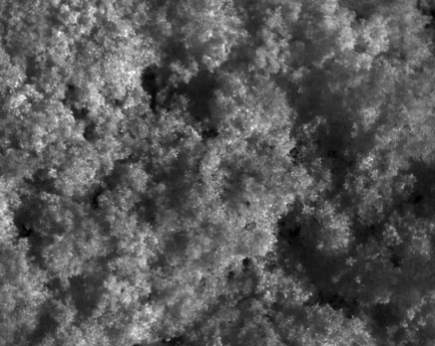

In [74]:
np_data = transform.resize(np_data, (346, 435, 1))
label_img = tf.keras.preprocessing.image.array_to_img(np_data)
label_img

In [82]:
type(label_img)

PIL.Image.Image

In [ ]:
img_shape = (435, 347, 3)
batch_size = 16


In [31]:
train_images = glob.glob(train_image_path + '*/*.jpg')

print(len(train_images))

500


In [32]:
train_images[1]

'./train/133436/IR_133436_input.jpg'

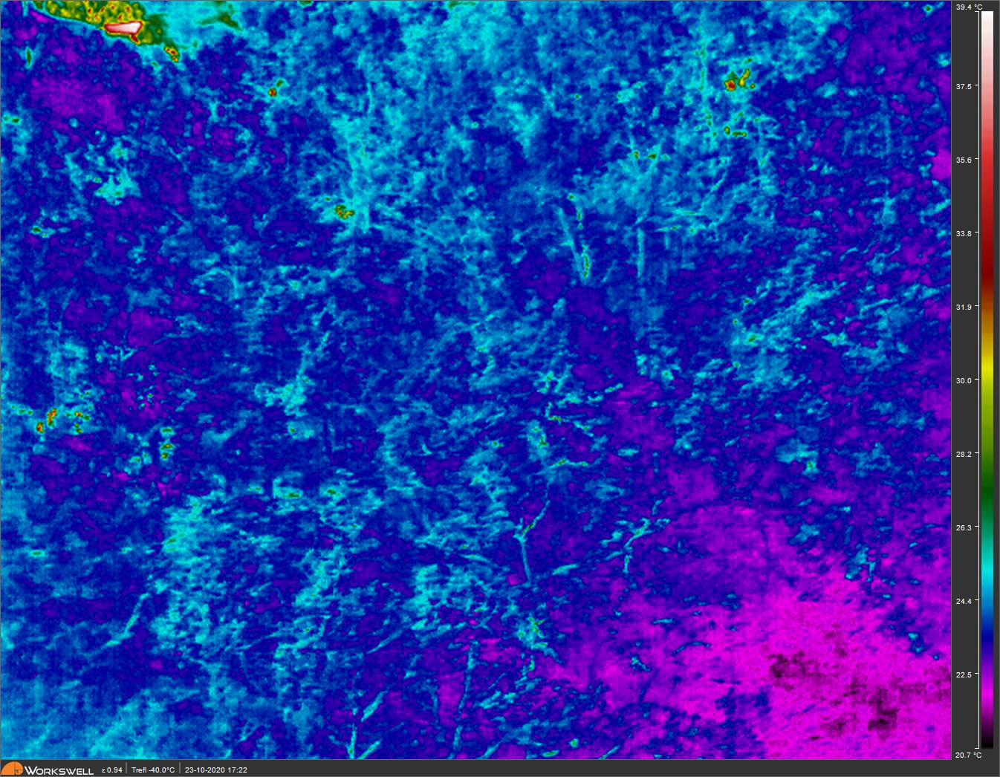

In [16]:
from PIL import Image

Image.open(train_images[0])

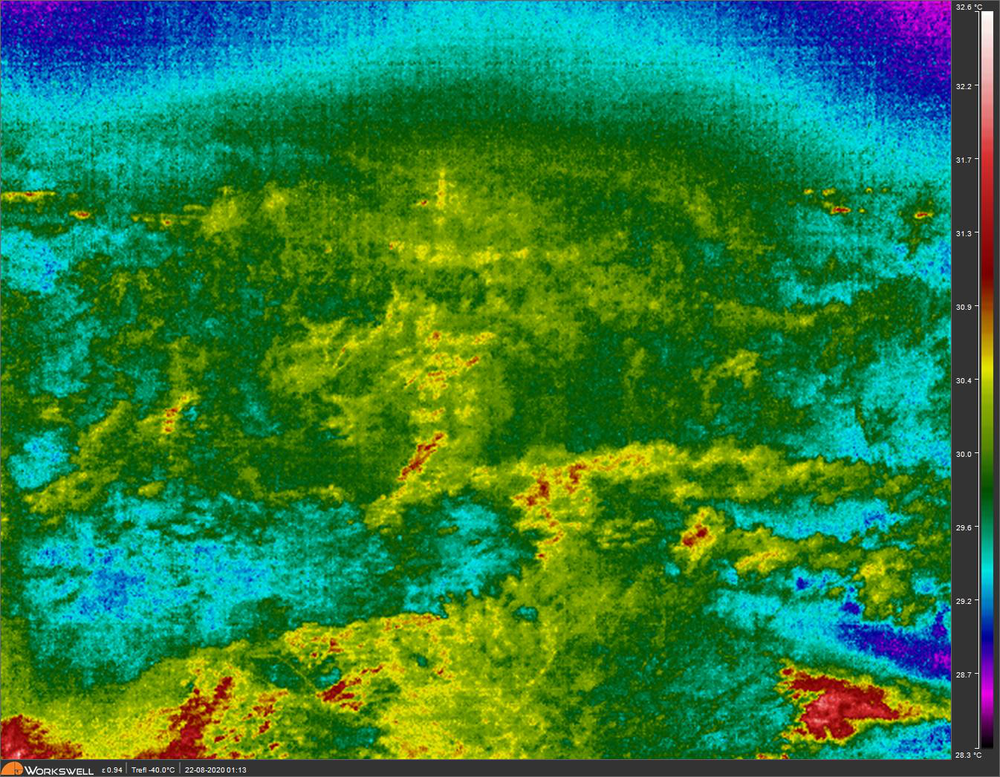

In [17]:
Image.open(train_images[50])